<a href="https://colab.research.google.com/github/niconielsen32/NeuralNetworks/blob/main/logoDetector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# General Logo Detector with YOLOv5

## Setup

In [3]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 9966, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 9966 (delta 15), reused 18 (delta 9), pack-reused 9928
Receiving objects: 100% (9966/9966), 10.30 MiB | 25.66 MiB/s, done.
Resolving deltas: 100% (6904/6904), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.2 MB/s 
     |████████████████████████████████| 145 kB 6.5 MB/s 
     |████████████████████████████████| 178 kB 30.7 MB/s 
     |████████████████████████████████| 1.1 MB 41.2 MB/s 
     |████████████████████████████████| 138 kB 49.0 MB/s 
     |████████████████████████████████| 62 kB 878 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires

In [4]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [5]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

## Get dataset from Roboflow
Convert dataset from Pascal VOC XML annotation to YOLOv5 PyTorch TXT

In [6]:
from roboflow import Roboflow
rf = Roboflow(api_key="Owb7wL0INQDuAuAz9gth")
project = rf.workspace().project("logo-detector-cgxef")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Logo-Detector-1 in yolov5pytorch:: 100%|██████████| 19695/19695 [00:21<00:00, 929.10it/s] 


## Train The Yolo Model


*   416x416 dimensions
*   Batch size of 16
*   30 Epochs
*   Small yolov5 model
*   Cache images during training
*   Single class training







In [7]:
!python train.py --img 416 --batch 16 --epochs 1 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --single-cls

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Logo-Detector-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=1, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=True, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-94-g47fac9f torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tr

## Show Training Results

In [8]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Prediction

In [15]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Logo-Detector-1/valid/images, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-94-g47fac9f torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1857 /content/datasets/Logo-Detector-1/valid/images/1016381746_jpg.rf.9ab8919cfa4bb0d2c592a860961c22bb.jpg: 416x416 Done. (0.028s)
image 2/1857 /content/datasets/Logo-Detector-1/valid/images/112818523_jpg.rf.0cbea2594fefc88f044a3e46449b41ae.jpg: 416x416 3 items, Done. (0.028s)
image 3/1857 /content/datasets/Logo-Detector-1/valid/images/119255964_jpg.rf.d8066e839

## Display Inference Images

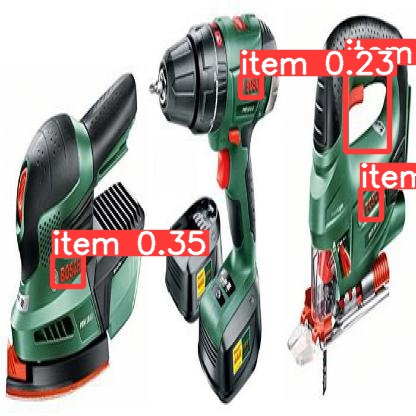

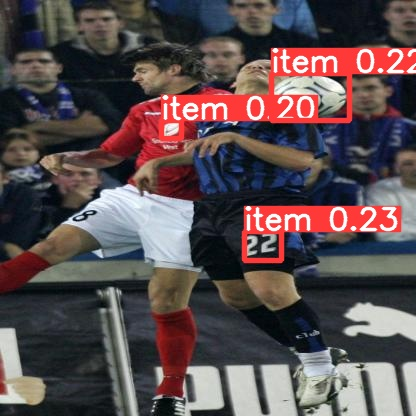

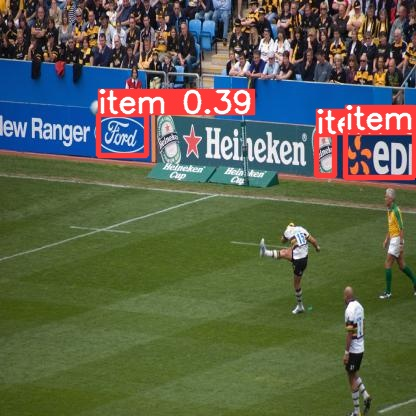

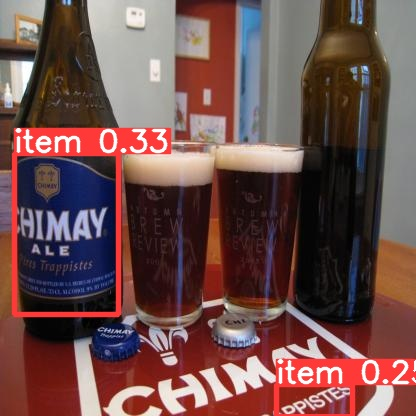

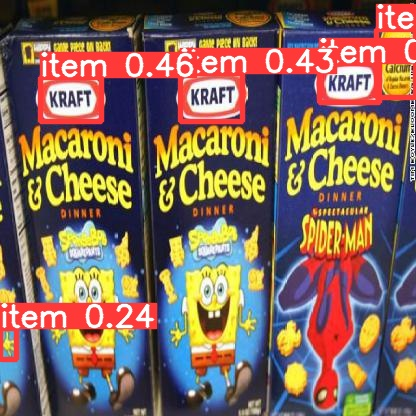

...

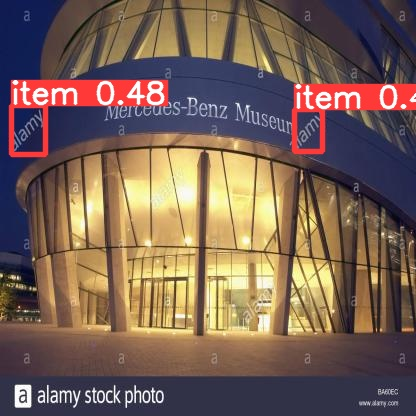

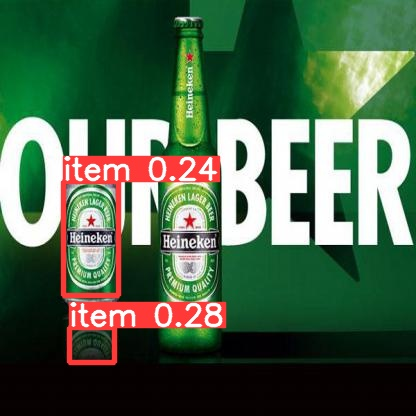

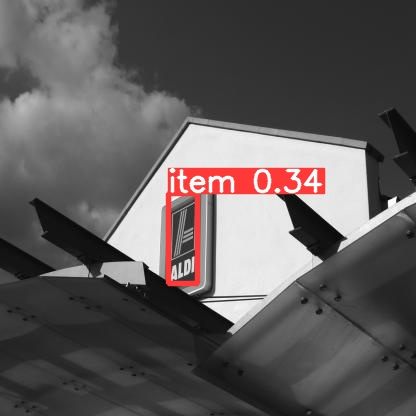

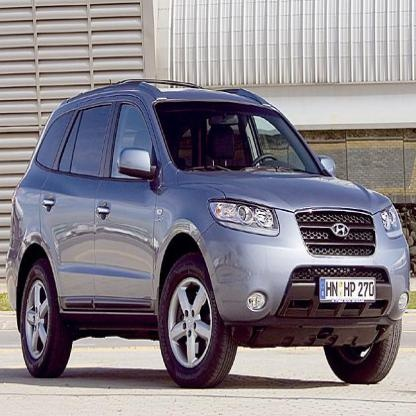

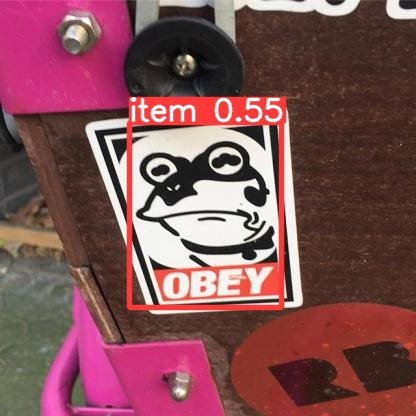

In [17]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    i += 1

    if i < 30:
      display(Image(filename=imageName))
      print("\n")

## Save Model

In [11]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>